In [1]:
import os
import logging
#from ananke.models.collection import Collection#, LegacyCollection
from ananke.configurations.collection import HDF5StorageConfiguration
logging.getLogger().setLevel(logging.INFO)
import time

In [2]:
from ananke.models.collection import Collection
from ananke.configurations.collection import MergeConfiguration
from ananke.schemas.event import RecordType
import os

In [3]:
import os

from ananke.configurations.collection import (
    HDF5StorageConfiguration,
    MergeConfiguration, MergeContentConfiguration,
)
from ananke.configurations.events import (
    RedistributionConfiguration,
    Interval,
    EventRedistributionMode,
)
from ananke.visualisation.event import draw_hit_histogram, draw_hit_distribution
from ananke.visualisation.detector import get_detector_scatter3ds
from olympus.configuration.generators import (
    EventGeneratorConfiguration,
    NoiseGeneratorConfiguration,
)
from olympus.configuration.generators import GenerationConfiguration
from olympus.event_generation.medium import MediumEstimationVariant
from olympus.configuration.generators import UniformSpectrumConfiguration
from ananke.models.collection import Collection
from ananke.schemas.event import EventType, NoiseType, RecordType
from olympus.configuration.photon_propagation import MockPhotonPropagatorConfiguration

from olympus.configuration.generators import DatasetConfiguration
from olympus.configuration.generators import BioluminescenceGeneratorConfiguration

from ananke.configurations.presets.detector import single_line_configuration
from olympus.event_generation.generators import generate


No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/mpcdf/soft/SLE_15/packages/skylake/jax/anaconda_3_2023.03-2023.03-cuda_12.1-12.1.1/0.4.13/lib/python3.10/site-packages/jax/_src/api_util.py:229: SyntaxWarning: Jitted function has invalid argnames {'interactions'} in static_argnames. Function does not take these args.This warning will be replaced by an error after 2022-08-20 at the earliest.
  warnings.warn(f"Jitted function has invalid argnames {invalid_argnames} "


In [6]:
#detector_configuration = detector
data_path = 'data/'
merged_data_path = 'data/example/06_digital_twin_merged_grid.h5'

storage_configuration = HDF5StorageConfiguration(
    data_path=data_path,
    read_only=False
)

merged_storage_configuration = HDF5StorageConfiguration(
    data_path=merged_data_path,
    read_only=False
)

In [7]:
# This is optional
photon_propagator_configuration = MockPhotonPropagatorConfiguration(
    resolution=18000,
    medium=MediumEstimationVariant.PONE_OPTIMISTIC,
    max_memory_usage=int(2147483648 / 4)  # Great to overcome memory issues
)

In [9]:
in_collection=[]
for name in filenames:
    storage_configuration = HDF5StorageConfiguration(
    data_path='data/'+name,
    read_only=False
    )
    in_collection.append(storage_configuration)

In [37]:
in_collection=HDF5StorageConfiguration(
    data_path='data/EverythinMergedWithAllNoise.h5',
    read_only=False
)
out_collection=HDF5StorageConfiguration(
        data_path='data/EverythingRedistributed60.h5',
        read_only=False
    )

print(in_collection)
print(out_collection)

type=<StorageTypes.HDF5: 'hdf5'> read_only=False batch_size=100 data_path='data/EverythinMergedWithAllNoise.h5' complevel=3 complib='lzo' optlevel=6
type=<StorageTypes.HDF5: 'hdf5'> read_only=False batch_size=100 data_path='data/Redistributed25.h5' complevel=3 complib='lzo' optlevel=6


In [40]:
merge_config = MergeConfiguration(
    in_collections=[in_collection],
    out_collection=out_collection,
    content=[
        MergeContentConfiguration(
            primary_type=RecordType.CASCADE,
            secondary_types=[
                RecordType.ELECTRICAL,
                RecordType.BIOLUMINESCENCE
            ],
            interval=Interval(),
            number_of_records=5
        ),
                MergeContentConfiguration(
            primary_type=RecordType.REALISTIC_TRACK,
            secondary_types=[
                RecordType.ELECTRICAL,
                RecordType.BIOLUMINESCENCE
            ],
            interval=Interval(),
            number_of_records=5
        ),
        MergeContentConfiguration(
            primary_type=RecordType.STARTING_TRACK,
            secondary_types=[
                RecordType.ELECTRICAL,
                RecordType.BIOLUMINESCENCE
            ],
            interval=Interval(),
            number_of_records=5
        ),
       # MergeContentConfiguration(
          #  primary_type=RecordType.BIOLUMINESCENCE,
         #   secondary_types=[
        #        RecordType.ELECTRICAL
       #     ],
      #      interval=Interval(),
     #       number_of_records=5
    #    ),
   #     MergeContentConfiguration(
          #  primary_type=RecordType.ELECTRICAL,
         #   interval=Interval(),
        #    number_of_records=5
       # )
    ],
    redistribution=RedistributionConfiguration(
        interval=Interval(),
        mode=EventRedistributionMode.CONTAINS_EVENT
    )
)

In [41]:
a=time.time()
collection=Collection.from_merge(merge_config)
print("it took: ",time.time()-a)

INFO:root:Starting to merge collections with config.
INFO:root:Starting to create joined temporary collection.
100it [01:18,  1.28it/s]              
INFO:Collection:Starting to redistribute with mode: contains_event
100%|██████████| 60/60 [39:32<00:00, 39.55s/it]
INFO:Collection:Finished to redistribute with mode: contains_event
INFO:root:Starting to create 5 RecordType.CASCADE records
INFO:root:Secondary types: 20, 21
100%|██████████| 5/5 [00:01<00:00,  2.54it/s]
INFO:root:Finished to create 5 RecordType.CASCADE records
INFO:root:Starting to create 5 RecordType.REALISTIC_TRACK records
INFO:root:Secondary types: 20, 21
100%|██████████| 5/5 [00:00<00:00,  5.13it/s]
INFO:root:Finished to create 5 RecordType.REALISTIC_TRACK records
INFO:root:Starting to create 5 RecordType.STARTING_TRACK records
INFO:root:Secondary types: 20, 21
100%|██████████| 5/5 [00:09<00:00,  1.88s/it]
INFO:root:Finished to create 5 RecordType.STARTING_TRACK records
INFO:root:Finished to merge collections with confi

it took:  2463.9890105724335


In [42]:
2463/60

41.05

In [25]:
path='data/'
config=MergeConfiguration.parse_obj(
    {
        'in_collections':[
            {
                'type':'hdf5',
                'data_path':path+'HexRealTracks.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexStartingTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexCascadeBenchMark.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexBioluminescenceBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'Hex_electrical_noise_10_BM.h5',
                'read_only':'False',
            },
        ],
        'out_collection': {
                'type': 'hdf5',
                'data_path': path+'AllMerge25.h5',
                'read_only':'False',
        },
        'content':[
            {
                'primary_type': RecordType.REALISTIC_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 5,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.CASCADE.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 5,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.STARTING_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 5,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.BIOLUMINESCENCE.value,
                'secondary_types': [RecordType.ELECTRICAL.value],
                'number_of_records': 5,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.ELECTRICAL.value,
                'number_of_records': 5,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
        ],
        
    }
)

a=time.time()
collection=Collection.from_merge(config)
print("it took: ",time.time()-a)

INFO:root:Starting to merge collections with config.
INFO:root:Starting to create joined temporary collection.
100it [00:00, 320.45it/s]             
INFO:Collection:Starting to append collection.
100it [00:01, 70.83it/s]              
INFO:Collection:Finished to append collection.
INFO:Collection:Starting to append collection.
100it [00:03, 26.98it/s]              
INFO:Collection:Finished to append collection.
INFO:Collection:Starting to append collection.
100it [00:00, 1149.00it/s]            
INFO:Collection:Finished to append collection.
INFO:Collection:Starting to append collection.
100it [00:00, 2796.69it/s]            
INFO:Collection:Finished to append collection.
INFO:root:Finished creating joined temporary collection.
INFO:root:Starting to create 5 RecordType.REALISTIC_TRACK records
INFO:root:Secondary types: 20, 21
100%|██████████| 5/5 [00:05<00:00,  1.18s/it]
INFO:root:Finished to create 5 RecordType.REALISTIC_TRACK records
INFO:root:Starting to create 5 RecordType.CASCADE

it took:  24.654568195343018


In [7]:
path='data/'
config=MergeConfiguration.parse_obj(
    {
        'in_collections':[
            {
                'type':'hdf5',
                'data_path':path+'HexRealTracks.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexStartingTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexCascadeBenchMark.h5',
                'read_only':'False',
            },
            {
                'type':'hdf5',
                'data_path':path+'HexBioluminescenceBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'Hex_electrical_noise_10_BM.h5',
                'read_only':'False',
            },
        ],
        'out_collection': {
                'type': 'hdf5',
                'data_path': path+'Mode_contains_hits.h5',
        },
        'redistribution': {
            'interval': {
                'start': 0,
                'end': 1000
            },
            'mode': EventRedistributionMode.
        },
    }
)

In [ ]:
a=time.time()
collection=Collection.from_merge(config)
print("it took: ",time.time()-a)

In [37]:
collection.close()

In [4]:
configuration = HDF5StorageConfiguration(data_path='data/AllMerge5.h5',read_only=False)

In [5]:
C1=Collection(configuration)

In [6]:
C1.open()
detector1=C1.storage.get_detector()
hits1=C1.storage.get_hits()
sources1=C1.storage.get_sources()
C1.close()

In [18]:
hits1.df['record_id'].drop_duplicates()

0          8
217558     2
424746    26
570186    30
668521    34
Name: record_id, dtype: int64

/u/arego/.local/lib/python3.10/site-packages/ananke/visualisation/detector.py:81: PerformanceWarning:

indexing past lexsort depth may impact performance.



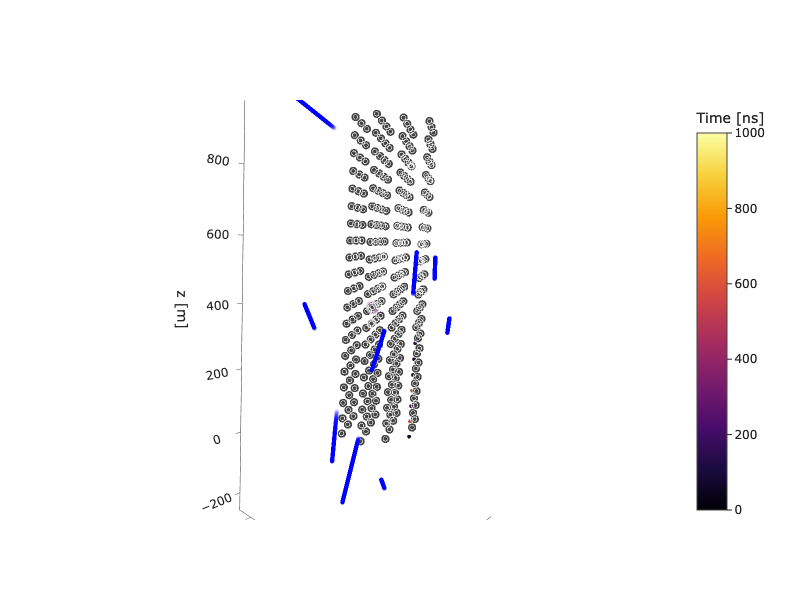

/u/arego/.local/lib/python3.10/site-packages/ananke/visualisation/detector.py:81: PerformanceWarning:

indexing past lexsort depth may impact performance.



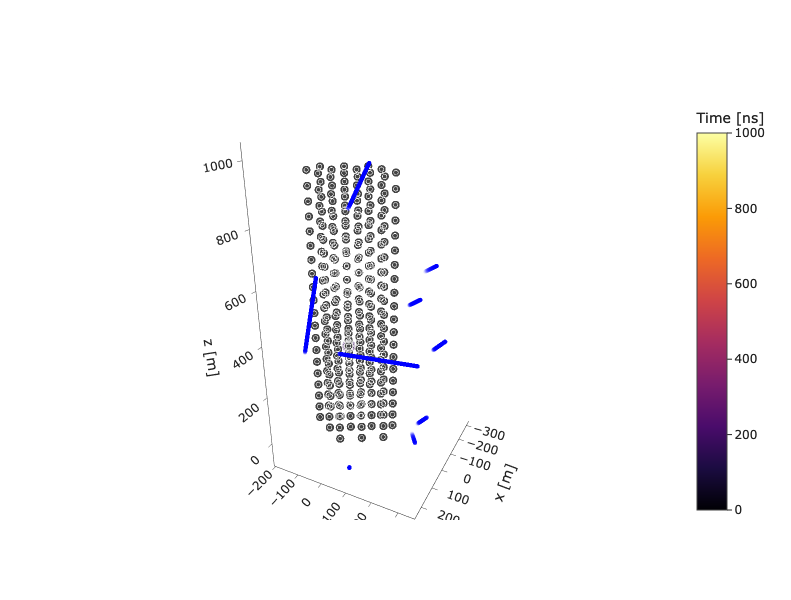

/u/arego/.local/lib/python3.10/site-packages/ananke/visualisation/detector.py:81: PerformanceWarning:

indexing past lexsort depth may impact performance.



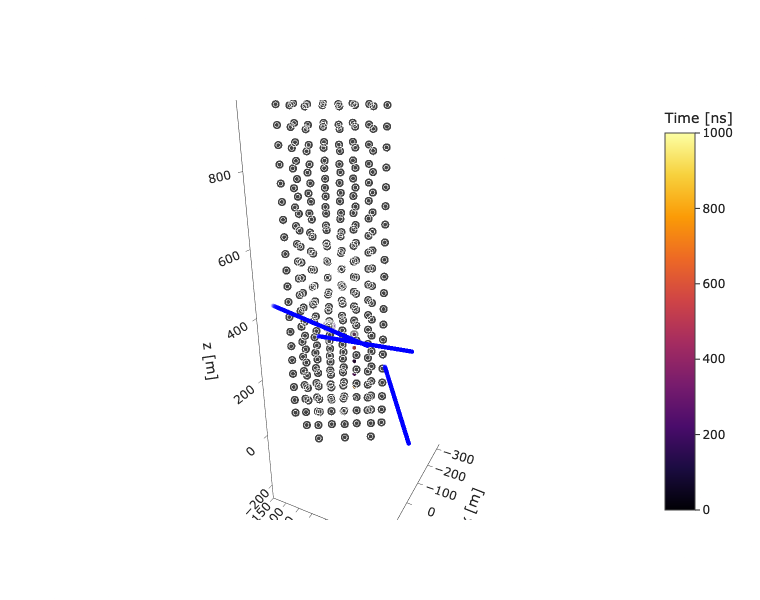

/u/arego/.local/lib/python3.10/site-packages/ananke/visualisation/detector.py:81: PerformanceWarning:

indexing past lexsort depth may impact performance.



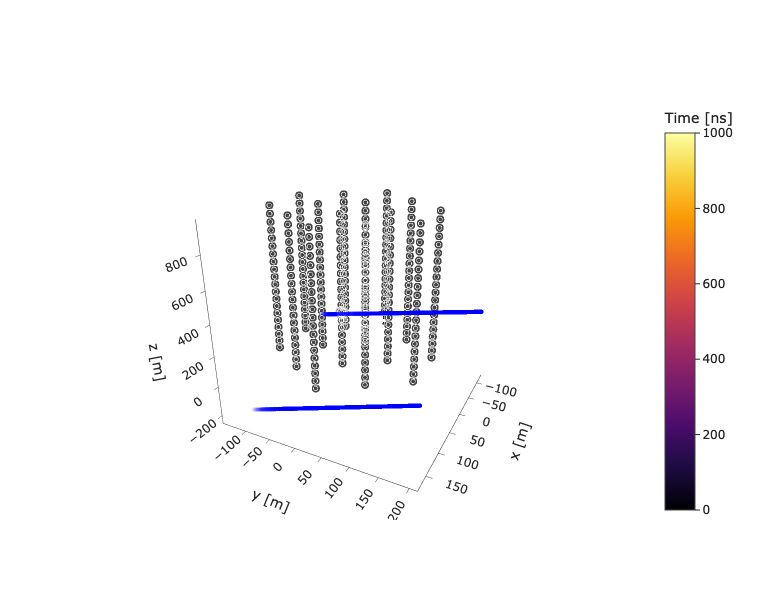

/u/arego/.local/lib/python3.10/site-packages/ananke/visualisation/detector.py:81: PerformanceWarning:

indexing past lexsort depth may impact performance.



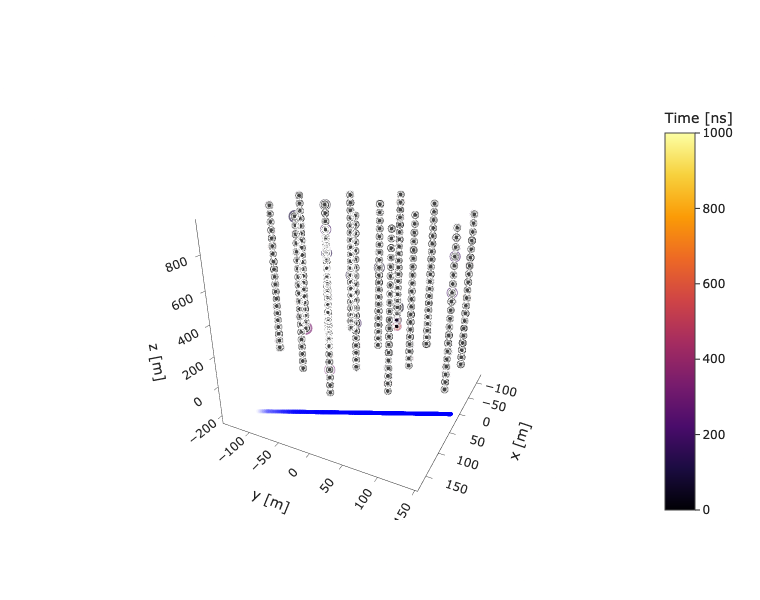

In [22]:
for i in hits1.df['record_id'].drop_duplicates():
    fig=get_detector_scatter3ds(
        detector1,
        include_modules=False,
        include_pmts=True,
        hits=hits1.get_by_record_ids(i),
        sources=sources1.get_by_record_ids(i)
    )

    fig.show()

In [21]:
get_detector_scatter3ds(
        detector2,
        include_modules=True,
        include_pmts=True,
        hits=hits2,
        sources=sources2
    )
fig.show()

NameError: name 'detector2' is not defined

In [29]:
collection.open()
detector2=collection.storage.get_detector()
hits2=collection.storage.get_hits()
sources2=collection.storage.get_sources()
collection.close()

In [ ]:
hits

In [8]:
path='data/'
configuration = MergeConfiguration.parse_obj(
    {
        'in_collections': [
            {
                'type': 'hdf5',
                'data_path': path+'Hex_electrical_noise_10_BM.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexCascadeBenchMark.h5',
                'read_only':'False',
            },
            
            {   'type': 'hdf5',
                'data_path': path+'HexTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexStartingTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexBioluminescenceBenchMark.h5',
                'read_only':'False',
            },
        ],
        'out_collection': {
                'type': 'hdf5',
                'data_path': path+'merged3.h5',
                'read_only':'False',
        },
        'content': [
            {
                'primary_type': RecordType.CASCADE.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 10,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.REALISTIC_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 10,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.STARTING_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 10,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.BIOLUMINESCENCE.value,
                'secondary_type':[RecordType.ELECTRICAL.value],
                'number_of_records': 10,
                'interval': {
                    'start': 0,
                    'end': 1000
                }

            },
            {
                'primary_type': RecordType.ELECTRICAL.value,
                'number_of_records': 10,
                'interval': {
                    'start': 0,
                    'end': 1000
                }

            },
        ]
    }
)



In [6]:
path='data/'
configuration = MergeConfiguration.parse_obj(
    {
        'in_collections': [
            {
                'type': 'hdf5',
                'data_path': path+'Hex_electrical_noise_10_BM.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexCascadeBenchMark.h5',
                'read_only':'False',
            },
            
            {   'type': 'hdf5',
                'data_path': path+'HexTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexStartingTrackBenchMark.h5',
                'read_only':'False',
            },
            {
                'type': 'hdf5',
                'data_path': path+'HexBioluminescenceBenchMark.h5',
                'read_only':'False',
            },
        ],
        'out_collection': {
                'type': 'hdf5',
                'data_path': path+'merged3.h5',
                'read_only':'False',
        },
        'content': [
            {
                'primary_type': RecordType.CASCADE.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 2,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.REALISTIC_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 2,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.STARTING_TRACK.value,
                'secondary_types': [RecordType.ELECTRICAL.value,RecordType.BIOLUMINESCENCE.value],
                'number_of_records': 2,
                'interval': {
                    'start': 0,
                    'end': 1000
                }
            },
            {
                'primary_type': RecordType.BIOLUMINESCENCE.value,
                'secondary_type':[RecordType.ELECTRICAL.value],
                'number_of_records': 2,
                'interval': {
                    'start': 0,
                    'end': 1000
                }

            },
            {
                'primary_type': RecordType.ELECTRICAL.value,
                'number_of_records': 2,
                'interval': {
                    'start': 0,
                    'end': 1000
                }

            },
        ]
    }
)



In [9]:
a=time.time()
collection=Collection.from_merge(configuration)
print("it took: ",time.time()-a)

INFO:root:Starting to merge collections with config.
INFO:root:Starting to create joined temporary collection.
100it [00:00, 2515.10it/s]            
INFO:Collection:Starting to append collection.
100it [00:03, 25.03it/s]              
INFO:Collection:Finished to append collection.
INFO:Collection:Starting to append collection.


AttributeError: 'NoneType' object has no attribute 'df'

In [21]:
configuration = HDF5StorageConfiguration(data_path='data/example/HexCascadeBenchMark.h5',read_only=False)

In [22]:
legacy_collection=Collection(configuration)

In [23]:
legacy_collection.open()

In [31]:
hits=legacy_collection.storage.get_hits().df
hits[hits['record_id']==2]

,time,string_id,module_id,pmt_id,record_id,type
0,766.015799,0,6,5,2,1
1,772.440804,0,6,5,2,1
2,768.273059,0,6,5,2,1
3,770.374201,0,6,5,2,1
4,777.413394,0,6,5,2,1
...,...,...,...,...,...,...
40510,1258.827011,5,13,10,2,1
40511,1265.033041,5,13,10,2,1
40512,1259.559522,5,13,10,2,1
40513,1260.559936,5,13,10,2,1


In [32]:
collection.open()

In [36]:
hits=collection.storage.get_hits().df
hits[hits['type']==1]

,time,pmt_id,record_id,string_id,module_id,type
472,867.674639,3,9,1,5,1
473,874.642334,3,9,1,5,1
474,870.282788,3,9,1,5,1
475,872.206076,3,9,1,5,1
476,878.598266,3,9,1,5,1
...,...,...,...,...,...,...
6005000,846.535770,12,52,8,10,1
6005001,846.461301,12,52,8,10,1
6005002,849.626328,12,52,8,10,1
6005003,849.186330,12,52,8,10,1


Closing remaining open files:data/example/HexCascadeBenchMark.h5...done/u/arego/.local/lib/python3.10/site-packages/ananke/configurations/../../_tmp_abe708c0-76ed-42aa-9231-d03ce76a3207data.h5...done/u/arego/.local/lib/python3.10/site-packages/ananke/configurations/../../_tmp_42c9f43b-021e-47f7-807c-e856f1a62a92data.h5...donedata/example/HexBioluminescenceBenchMark.h5...donedata/example/HexTrackBenchMark.h5...done/u/arego/.local/lib/python3.10/site-packages/ananke/configurations/../../_tmp_42c9f43b-021e-47f7-807c-e856f1a62a92data.h5...donedata/example/HexCascadeBenchMark.h5...done/u/arego/.local/lib/python3.10/site-packages/ananke/configurations/../../_tmp_06cf85c4-4729-4678-9120-348586f907bbdata.h5...donedata/example/HexCascadeBenchMark.h5...donedata/example/merged3.h5...donedata/example/HexStartingTrackBenchMark.h5...done/u/arego/.local/lib/python3.10/site-packages/ananke/configurations/../../_tmp_06cf85c4-4729-4678-9120-348586f907bbdata.h5...done/u/arego/.local/lib/python3.10/site-p

In [1]:
from ananke.visualisation.detector import get_detector_scatter3ds